In [2]:
# Basic Libraries Imporatation
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import nbformat
import warnings
warnings.filterwarnings("ignore")

In [ ]:
df = pd.read_csv("chatgpt_reviews.csv")
df

,reviewId,userName,content,score,thumbsUpCount,reviewCreatedVersion,at,appVersion
0,5da16f5f-8e66-4542-a59f-9b2f99493c9e,elham ahmed,جميل جدا,3,0,1.2025.283,2025-10-17 11:52:50,1.2025.283
1,96659b03-344a-4c07-a345-796d87a9556e,Akkamahadevi Alru,sexy app,5,0,1.2025.283,2025-10-17 11:52:04,1.2025.283
2,5fdae797-7d54-47bb-a950-30de7a37a394,Priyo Gayen,it was doing great but randomly forget all the...,1,2,1.2025.283,2025-10-17 11:51:59,1.2025.283
3,f7349ddf-c6d1-4013-9b5a-dae64d9d54b7,A Mahmoud,بجد برنامج جميل جدا,3,0,1.2025.283,2025-10-17 11:51:24,1.2025.283
4,6fcbb285-7610-4b42-b571-111f0cc107b2,Madhuben Makwana,best thing,5,0,1.2025.283,2025-10-17 11:49:11,1.2025.283
...,...,...,...,...,...,...,...,...
843484,462686ff-e500-413c-a6b4-2badc2e3b21d,m.santhosh Kumar,Update 2023,5,0,NaN,2023-07-27 16:26:31,NaN
843485,f10e0d48-ecb6-42db-b103-46c0046f9be9,Andrew Bourgeois,its grear,5,0,NaN,2023-09-23 16:25:18,NaN
843486,df909a49-90b5-4dac-9b89-c4bd5a7c2f75,Dern Bob,Funtastic App,5,0,NaN,2023-11-08 13:57:14,NaN
843487,abe43878-973f-4e96-a765-c4af5c7f7b20,Abdur rahman arif,hi all,5,0,NaN,2023-07-25 15:32:57,NaN


In [3]:
df.duplicated().sum()

np.int64(2509)

In [4]:
df.drop_duplicates(inplace=True)

In [5]:
df.isna().sum()

reviewId                    0
userName                    2
content                    14
score                       0
thumbsUpCount               0
reviewCreatedVersion    63319
at                          0
appVersion              63319
dtype: int64

In [6]:
df.dropna(inplace=True)

In [7]:
df

,reviewId,userName,content,score,thumbsUpCount,reviewCreatedVersion,at,appVersion
0,5da16f5f-8e66-4542-a59f-9b2f99493c9e,elham ahmed,جميل جدا,3,0,1.2025.283,2025-10-17 11:52:50,1.2025.283
1,96659b03-344a-4c07-a345-796d87a9556e,Akkamahadevi Alru,sexy app,5,0,1.2025.283,2025-10-17 11:52:04,1.2025.283
2,5fdae797-7d54-47bb-a950-30de7a37a394,Priyo Gayen,it was doing great but randomly forget all the...,1,2,1.2025.283,2025-10-17 11:51:59,1.2025.283
3,f7349ddf-c6d1-4013-9b5a-dae64d9d54b7,A Mahmoud,بجد برنامج جميل جدا,3,0,1.2025.283,2025-10-17 11:51:24,1.2025.283
4,6fcbb285-7610-4b42-b571-111f0cc107b2,Madhuben Makwana,best thing,5,0,1.2025.283,2025-10-17 11:49:11,1.2025.283
...,...,...,...,...,...,...,...,...
839961,cabeabce-0819-44ae-ba73-e37f570f8ba0,Pragnesh Dobariya,🕸️,5,0,1.0.0016,2023-07-25 15:25:07,1.0.0016
839962,af435485-55cf-45ce-973f-a8474ce2add4,Prince shakya,❤️❤️❤️❤️❤️❤️❤️,5,0,1.0.0016,2023-07-25 15:10:51,1.0.0016
839963,1eff641a-fc9e-4364-98e3-0b9786a7c872,emdadul rayhan,❤️❤️❤️,5,0,1.0.0016,2023-07-25 15:11:13,1.0.0016
839964,4e691e40-30d3-47d7-815c-4271b6f19fee,Mahdir Mahim,❤️❤️❤️,5,0,1.0.0016,2023-07-25 18:10:27,1.0.0016


In [8]:
df['content'][1]

'sexy app'

In [9]:
import langid
langid.classify(df['content'][839965])


('en', 9.061840057373047)

In [10]:
df['language'] = df['content'].apply(lambda x : langid.classify(x)[0])
df

,reviewId,userName,content,score,thumbsUpCount,reviewCreatedVersion,at,appVersion,language
0,5da16f5f-8e66-4542-a59f-9b2f99493c9e,elham ahmed,جميل جدا,3,0,1.2025.283,2025-10-17 11:52:50,1.2025.283,ar
1,96659b03-344a-4c07-a345-796d87a9556e,Akkamahadevi Alru,sexy app,5,0,1.2025.283,2025-10-17 11:52:04,1.2025.283,en
2,5fdae797-7d54-47bb-a950-30de7a37a394,Priyo Gayen,it was doing great but randomly forget all the...,1,2,1.2025.283,2025-10-17 11:51:59,1.2025.283,en
3,f7349ddf-c6d1-4013-9b5a-dae64d9d54b7,A Mahmoud,بجد برنامج جميل جدا,3,0,1.2025.283,2025-10-17 11:51:24,1.2025.283,fa
4,6fcbb285-7610-4b42-b571-111f0cc107b2,Madhuben Makwana,best thing,5,0,1.2025.283,2025-10-17 11:49:11,1.2025.283,en
...,...,...,...,...,...,...,...,...,...
839961,cabeabce-0819-44ae-ba73-e37f570f8ba0,Pragnesh Dobariya,🕸️,5,0,1.0.0016,2023-07-25 15:25:07,1.0.0016,zh
839962,af435485-55cf-45ce-973f-a8474ce2add4,Prince shakya,❤️❤️❤️❤️❤️❤️❤️,5,0,1.0.0016,2023-07-25 15:10:51,1.0.0016,zh
839963,1eff641a-fc9e-4364-98e3-0b9786a7c872,emdadul rayhan,❤️❤️❤️,5,0,1.0.0016,2023-07-25 15:11:13,1.0.0016,zh
839964,4e691e40-30d3-47d7-815c-4271b6f19fee,Mahdir Mahim,❤️❤️❤️,5,0,1.0.0016,2023-07-25 18:10:27,1.0.0016,zh


In [12]:
df = df[df['language'] == 'en']

In [23]:
df.reset_index(drop=True,inplace=True)
df.drop(columns=['reviewCreatedVersion'],inplace=True)
df

,reviewId,userName,content,score,thumbsUpCount,at,appVersion,language
0,96659b03-344a-4c07-a345-796d87a9556e,Akkamahadevi Alru,sexy app,5,0,2025-10-17 11:52:04,1.2025.283,en
1,5fdae797-7d54-47bb-a950-30de7a37a394,Priyo Gayen,it was doing great but randomly forget all the...,1,2,2025-10-17 11:51:59,1.2025.283,en
2,6fcbb285-7610-4b42-b571-111f0cc107b2,Madhuben Makwana,best thing,5,0,2025-10-17 11:49:11,1.2025.283,en
3,f80f4d37-06ee-45fa-91a1-3ce14baefb29,Francis agbomire Momoh,Fast and easy,5,0,2025-10-17 11:46:55,1.2025.224,en
4,8b18b2a6-ea9b-4163-9ae2-ab8f2d2c2641,Arjen,okkkkk,5,0,2025-10-17 11:45:20,1.2025.283,en
...,...,...,...,...,...,...,...,...
602123,f0215094-7538-4eda-bc88-fcaa05ed5139,mahmudul hasan,😓😓,5,0,2023-07-25 21:04:12,1.0.0016,en
602124,07fbfb35-ddb2-4d07-bc05-1004152aed39,arif mia,🙂🙂,5,0,2023-07-25 18:25:41,1.0.0016,en
602125,f1339f3c-bacf-4ff1-bab3-f358ee297d14,M M Bayzid,🙂🙂,5,0,2023-07-25 15:17:01,1.0.0016,en
602126,f089fa94-c7a6-430c-8f68-3d3e758221ea,Himel Ahmed,😀😀😀😀😀😀😀😀😀,5,0,2023-07-25 15:13:15,1.0.0016,en


In [24]:
df.to_csv("chatgpt_reviews_en.csv")

In [21]:
df['content'].value_counts()

content
good           56938
nice           23523
very good      11586
best            8718
super           8120
               ...  
Full mark          1
Finally App        1
😓😓                 1
😀😀😀😀😀😀😀😀😀          1
Need Images        1
Name: count, Length: 301733, dtype: int64

In [3]:
df = pd.read_csv("D:\GIT\AI-Echo-NLP-Sentimental-Analysis\chatgpt_reviews_en_clean.csv",index_col=0)
df

,date,version,user_name,review,thumbs_up_count,rating,final_text,char_len,word_len,label
0,2025-10-17 11:52:04,1.2025.283,Akkamahadevi Alru,sexy app,0,5,sexy app,8,2,pos
1,2025-10-17 11:51:59,1.2025.283,Priyo Gayen,it was doing great but randomly forget all the...,2,1,great randomly forget memory everything even t...,122,16,pos
2,2025-10-17 11:49:11,1.2025.283,Madhuben Makwana,best thing,0,5,best thing,10,2,pos
3,2025-10-17 11:46:55,1.2025.224,Francis agbomire Momoh,fast and easy,0,5,fast easy,9,2,pos
4,2025-10-17 11:45:20,1.2025.283,Arjen,okkkkk,0,5,okkkkk,6,1,neu
...,...,...,...,...,...,...,...,...,...,...
600830,2023-07-25 15:19:05,1.0.0016,praveen kumar,just installed,0,5,installed,9,1,neu
600831,2023-07-26 07:53:29,1.0.0016,Parth Sarthi,first review,0,5,first review,12,2,neu
600832,2023-07-25 16:14:18,1.0.0016,Shakkir K,full mark,0,5,full mark,9,2,neu
600833,2023-07-25 15:44:37,1.0.0016,Laijul Karim,finally app,0,5,finally app,11,2,neu


In [5]:
df['date'] =  pd.to_datetime(df['date'], format='%Y-%m-%d %H:%M:%S')

In [6]:
my_col = [
    '#FF6F61',  
    '#6B5B95',  
    '#88B04B', 
    '#F7CAC9', 
    '#92A8D1',  
    '#FFA500', 
    '#00CED1', 
    '#FFB347',  
    '#D65076',  
    '#45B8AC'   
]

In [9]:
fig = px.histogram(df,
                x ='label',
                color = 'label',
                color_discrete_sequence = my_col,
                title='Sentiment Distribution'
                    )
fig.show()

In [8]:
fig = px.histogram(df,
                    x='rating',
                    color='label',
                    color_discrete_sequence=my_col,
                    title='Rating Distribution by Rating',
                    )
fig.show()

In [17]:
px.pie(df.groupby('rating').count()['final_text'],
         values='final_text',
         names=df.groupby('rating').count().index,
         title='Rating Distribution Pie Chart'
         ).show()
       
       

In [ ]:
fig = px.histogram(df,
                   x='char_len',
                   color='label',
                   color_discrete_sequence=my_col,
                   title='Character Length Distribution by Sentiment').show()

In [19]:
fig = px.histogram(df,
                           x='word_len',
                           color='label',
                           color_discrete_sequence=my_col,
                           title='Word Length Distribution by Sentiment').show()

In [26]:
px.imshow(pd.crosstab(df['rating'],df['label']),
          text_auto=True,
          title='Rating vs Sentiment Heatmap').show()

In [177]:
t_df = df.groupby('label')['thumbs_up_count'].sum().reset_index()
fig = px.pie(
    t_df,
    values='thumbs_up_count',
    hover_name='label',
    hole=0.5
)
fig.show()

In [31]:
t_df = df['user_name'].value_counts().head(10).reset_index()

,user_name,count
0,Rahul Kumar,174
1,A Google user,172
2,Amit Kumar,156
3,Rohit Kumar,145
4,Manish Kumar,143
5,Ravi Kumar,140
6,Prince Kumar,138
7,Ajay Kumar,130
8,Deepak Kumar,129
9,Aman Kumar,126


In [33]:
t_df = df['user_name'].value_counts().head(10).reset_index()
fig = px.bar(t_df,
             x='user_name',
             y='count',
             color='user_name',
            title='Top 10 Active Users by Reviews'
            )
fig.update_layout(
                title ={'x':0.5},
                )
fig.update_traces(showlegend=False)
fig

In [37]:
df['date'].dt.year.value_counts().reset_index()

,date,count
0,2025,371044
1,2024,195557
2,2023,34234


In [39]:
t_df = df['date'].dt.year.value_counts().reset_index()
fig = px.bar(t_df,
             x='date',
             y='count',
             color='date',
            title='Reviews by Year'
            )
fig.update_layout(
                        title ={'x':0.25},
                        )
fig.update_traces(showlegend=False)
fig.show()

In [48]:
t_df = df
t_df['month'] = t_df['date'].dt.month_name()
fig = px.imshow(pd.crosstab(t_df['label'],t_df['month']),
          text_auto=True)
fig.update_layout(
    width = 800
)
fig.show()


In [51]:
t_df = df.groupby('label')['char_len'].mean().reset_index()
px.bar(t_df,
       x='label',
       y='char_len',
       color='label',
       color_discrete_sequence=my_col,
       title='Average Character Length by Sentiment'
       ).show()

In [53]:
t_df = df.groupby('label')['word_len'].mean().reset_index()
px.bar(t_df,
       x='label',
       y='word_len',
       color='label',
       color_discrete_sequence=my_col,
       title='Average Word Length by Sentiment'
       ).show()

In [67]:
df[df['rating'] == 1]['final_text'].str.split().explode().value_counts().head(10)

final_text
app        8809
not        5839
good       5550
time       2911
cannot     2727
bad        2696
answer     2255
even       2215
do         2145
chatgpt    2124
Name: count, dtype: int64

In [71]:
t_df1 = df[df['rating'] == 1]['final_text'].str.split().explode().value_counts().head(10).reset_index()
t_df1['rating'] = 1
t_df2 = df[df['rating'] == 2]['final_text'].str.split().explode().value_counts().head(10).reset_index()
t_df2['rating'] = 2
t_df3 = df[df['rating'] == 3]['final_text'].str.split().explode().value_counts().head(10).reset_index()
t_df3['rating'] = 3
t_df4 = df[df['rating'] == 4]['final_text'].str.split().explode().value_counts().head(10).reset_index()
t_df4['rating'] = 4
t_df5 = df[df['rating'] == 5]['final_text'].str.split().explode().value_counts().head(10).reset_index()
t_df5['rating'] = 5

t_df = pd.concat([t_df1,t_df2,t_df3,t_df4,t_df5],axis=0)

t_df

fig = px.funnel(t_df,
                y = 'count',
                x = 'final_text',
                color='rating',
                title = 'Top 10 Repeting words in each ratings ',
                color_discrete_sequence=my_col,
                labels= {'count':'Frequiency of the word',
                            'index':'Words'})
fig.update_layout(
    height = 600,
    title = { 'x' : 0.4}
)

In [73]:
t_df1 = df[df['label'] == 'pos']['final_text'].str.split().explode().value_counts().head(10).reset_index()
t_df1['rating'] = 'pos'
t_df2 = df[df['label'] == 'neu']['final_text'].str.split().explode().value_counts().head(10).reset_index()
t_df2['rating'] = 'neu'
t_df3 = df[df['label'] == 'neg']['final_text'].str.split().explode().value_counts().head(10).reset_index()
t_df3['rating'] = 'neg'

t_df = pd.concat([t_df1,t_df2,t_df3],axis=0)

t_df
fig = px.funnel(t_df,
                y = 'count',
                x = 'final_text',
                color='rating',
                title = 'Top 10 Repeting words in each ratings ',
                color_discrete_sequence=my_col,
                labels= {'count':'Frequiency of the word',
                            'index':'Words'})
fig.update_layout(
    height = 600,
    title = { 'x' : 0.4}
)

In [75]:
from wordcloud import WordCloud

In [ ]:
pos_words = df[df['label'] == 'pos']['final_text'].str.split().explode().to_list()
pos_words = ' '.join([str(word) for word in pos_words])
wordcloud=WordCloud(width=800,height=500,random_state=42,max_font_size=110).generate(pos_words)
fig = px.imshow(wordcloud,title="Rating 1 Words")

fig.update_layout(
    title ={'x':0.3}
)
fig.update_xaxes(visible=False)
fig.update_yaxes(visible=False)

In [103]:
pos_words = df[df['label'] == 'pos']['final_text'].str.split().explode().to_list()
pos_words = ' '.join([str(word) for word in pos_words])
wordcloud=WordCloud(width=800,height=500,random_state=42,max_font_size=110).generate(pos_words)
fig1 = px.imshow(wordcloud,title="Positive Words")

fig1.update_layout(
    title ={'x':0.3}
)
fig1.update_xaxes(visible=False)
fig1.update_yaxes(visible=False)

neu_words = df[df['label'] == 'neu']['final_text'].str.split().explode().to_list()
neu_words = ' '.join([str(word) for word in neu_words])
wordcloud=WordCloud(width=800,height=500,random_state=42,max_font_size=110).generate(neu_words)
fig2 = px.imshow(wordcloud,title="Neutral Words")

fig2.update_layout(
    title ={'x':0.3}
)
fig2.update_xaxes(visible=False)
fig2.update_yaxes(visible=False)

neg_words = df[df['label'] == 'neg']['final_text'].str.split().explode().to_list()
neg_words = ' '.join([str(word) for word in neg_words])
wordcloud=WordCloud(width=800,height=500,random_state=42,max_font_size=110).generate(neg_words)
fig3 = px.imshow(wordcloud,title="Negative Words")

fig3.update_layout(
    title ={'x':0.3}
)
fig3.update_xaxes(visible=False)
fig3.update_yaxes(visible=False)

fig1.show()
fig2.show()
fig3.show()

In [16]:
df

,date,version,user_name,review,thumbs_up_count,rating,final_text,char_len,word_len,label
0,2025-10-17 11:52:04,1.2025.283,Akkamahadevi Alru,sexy app,0,5,sexy app,8,2,pos
1,2025-10-17 11:51:59,1.2025.283,Priyo Gayen,it was doing great but randomly forget all the...,2,1,great randomly forget memory everything even t...,122,16,pos
2,2025-10-17 11:49:11,1.2025.283,Madhuben Makwana,best thing,0,5,best thing,10,2,pos
3,2025-10-17 11:46:55,1.2025.224,Francis agbomire Momoh,fast and easy,0,5,fast easy,9,2,pos
4,2025-10-17 11:45:20,1.2025.283,Arjen,okkkkk,0,5,okkkkk,6,1,neu
...,...,...,...,...,...,...,...,...,...,...
600830,2023-07-25 15:19:05,1.0.0016,praveen kumar,just installed,0,5,installed,9,1,neu
600831,2023-07-26 07:53:29,1.0.0016,Parth Sarthi,first review,0,5,first review,12,2,neu
600832,2023-07-25 16:14:18,1.0.0016,Shakkir K,full mark,0,5,full mark,9,2,neu
600833,2023-07-25 15:44:37,1.0.0016,Laijul Karim,finally app,0,5,finally app,11,2,neu


date                 0
version              0
user_name            0
review               0
thumbs_up_count      0
rating               0
final_text         646
char_len             0
word_len             0
label                0
month                0
dtype: int64

In [134]:
df = pd.read_csv("chatgpt_reviews_en_clean.csv",index_col=0)
df.isna().sum()
df.dropna(inplace=True)

In [135]:
x = df['final_text']
y = df['label']

In [136]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.3,stratify=y,random_state=42)
print(x_train.shape,x_test.shape,y_train.shape,y_test.shape)

(420132,) (180057,) (420132,) (180057,)


In [137]:
from imblearn.pipeline import Pipeline
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from imblearn.over_sampling import SMOTE
from sklearn.naive_bayes import MultinomialNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report,confusion_matrix,accuracy_score

In [154]:
from imblearn.pipeline import Pipeline

model = Pipeline(
    steps = [
    ('vec',TfidfVectorizer( max_features=500)),
    ('smote',SMOTE()),
    ('NB',LogisticRegression(class_weight={'neg':2,'neu':1,'pos':1})),
])
model

,steps,"[('vec', ...), ('smote', ...), ...]"
,transform_input,None
,memory,None
,verbose,False
,input,'content'
,encoding,'utf-8'
,decode_error,'strict'
,strip_accents,None
,lowercase,True
,preprocessor,None
,tokenizer,None


In [155]:
model.fit(x_train,y_train)

,steps,"[('vec', ...), ('smote', ...), ...]"
,transform_input,None
,memory,None
,verbose,False
,input,'content'
,encoding,'utf-8'
,decode_error,'strict'
,strip_accents,None
,lowercase,True
,preprocessor,None
,tokenizer,None


------------------------- Train Data -------------------------
              precision    recall  f1-score   support

         neg       0.30      0.80      0.43     20325
         neu       0.84      0.85      0.84     47862
         pos       0.99      0.89      0.94    351945

    accuracy                           0.88    420132
   macro avg       0.71      0.85      0.74    420132
weighted avg       0.94      0.88      0.91    420132

------------------------- Test Data -------------------------
              precision    recall  f1-score   support

         neg       0.30      0.80      0.43      8711
         neu       0.83      0.85      0.84     20512
         pos       0.99      0.89      0.94    150834

    accuracy                           0.88    180057
   macro avg       0.71      0.85      0.74    180057
weighted avg       0.94      0.88      0.90    180057



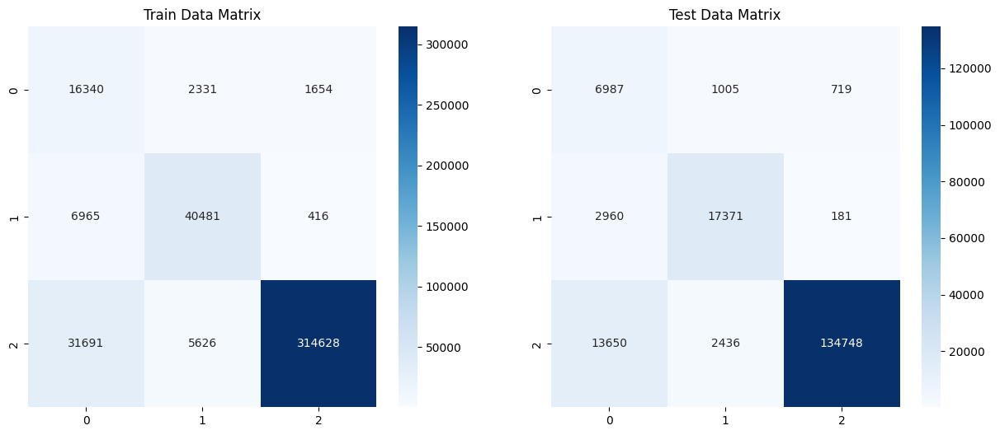

In [156]:
y_train_pread = model.predict(x_train)
y_test_pread = model.predict(x_test)

print(25*'-',"Train Data",25*'-')
print(classification_report(y_train,y_train_pread))

print(25*'-',"Test Data",25*'-')
print(classification_report(y_test,y_test_pread))

plt.figure(figsize=(15,6))

plt.subplot(1,2,1)
sns.heatmap(confusion_matrix(y_train,y_train_pread),annot=True,fmt='d',cmap='Blues')
plt.title("Train Data Matrix")

plt.subplot(1,2,2)
sns.heatmap(confusion_matrix(y_test,y_test_pread),annot=True,fmt='d',cmap='Blues')
plt.title("Test Data Matrix")

plt.show()

In [157]:
import pickle 
pickle.dump(model,open('model.pkl','wb'))

In [164]:
model.predict(pd.Series('watch'))

array(['neu'], dtype=object)

In [143]:
x

0                                                  sexy app
1         great randomly forget memory everything even t...
2                                                best thing
3                                                 fast easy
4                                                    okkkkk
                                ...                        
600830                                            installed
600831                                         first review
600832                                            full mark
600833                                          finally app
600834                                               system
Name: final_text, Length: 600189, dtype: object

In [144]:
y

0         pos
1         pos
2         pos
3         pos
4         neu
         ... 
600830    neu
600831    neu
600832    neu
600833    neu
600834    neu
Name: label, Length: 600189, dtype: object

In [167]:
pd.crosstab(df['version'],df['label'])

label,neg,neu,pos
version,,,
1.0.0016,117,412,1613
1.0.0022,95,227,1013
1.0.0023,304,415,2010
1.0.0026,86,106,509
1.0.0030,30,46,282
...,...,...,...
1.2025.259,221,515,3098
1.2025.266,264,504,3276
1.2025.273,563,1000,6324


In [165]:
df

,date,version,user_name,review,thumbs_up_count,rating,final_text,char_len,word_len,label
0,2025-10-17 11:52:04,1.2025.283,Akkamahadevi Alru,sexy app,0,5,sexy app,8,2,pos
1,2025-10-17 11:51:59,1.2025.283,Priyo Gayen,it was doing great but randomly forget all the...,2,1,great randomly forget memory everything even t...,122,16,pos
2,2025-10-17 11:49:11,1.2025.283,Madhuben Makwana,best thing,0,5,best thing,10,2,pos
3,2025-10-17 11:46:55,1.2025.224,Francis agbomire Momoh,fast and easy,0,5,fast easy,9,2,pos
4,2025-10-17 11:45:20,1.2025.283,Arjen,okkkkk,0,5,okkkkk,6,1,neu
...,...,...,...,...,...,...,...,...,...,...
600830,2023-07-25 15:19:05,1.0.0016,praveen kumar,just installed,0,5,installed,9,1,neu
600831,2023-07-26 07:53:29,1.0.0016,Parth Sarthi,first review,0,5,first review,12,2,neu
600832,2023-07-25 16:14:18,1.0.0016,Shakkir K,full mark,0,5,full mark,9,2,neu
600833,2023-07-25 15:44:37,1.0.0016,Laijul Karim,finally app,0,5,finally app,11,2,neu
